In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
ROOT_DIR = '/content/gdrive/MyDrive/DL_projects_colab/yolov8/'

In [ ]:
%cd {ROOT_DIR}

/content/gdrive/MyDrive/DL_projects_colab/yolov8


In [ ]:
# !git clone https://github.com/ultralytics/ultralytics.git

In [ ]:
%ls

dogs_n_cars.jpg          runs/             ultralytics/    yolov8s-seg.pt
input/                   street_video.mp4  yolov8n.pt
result_street_video.mp4  test_vid2.mp4     yolov8n-seg.pt


In [ ]:
%cd ultralytics

/content/gdrive/MyDrive/DL_projects_colab/yolov8/ultralytics


In [ ]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install ultralytics


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
%cd {ROOT_DIR}

/content/gdrive/MyDrive/DL_projects_colab/yolov8


In [ ]:
!pip install Ipython

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import matplotlib.pyplot as plt
from IPython.display import Image as imgshow
import os

## Object detection

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.7 source="input/dogs_n_cars.jpg" save=True

Ultralytics YOLOv8.0.31 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/gdrive/MyDrive/DL_projects_colab/yolov8/input/dogs_n_cars.jpg: 640x640 5 persons, 8 cars, 8 dogs, 2 cows, 9.3ms
Speed: 0.7ms pre-process, 9.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


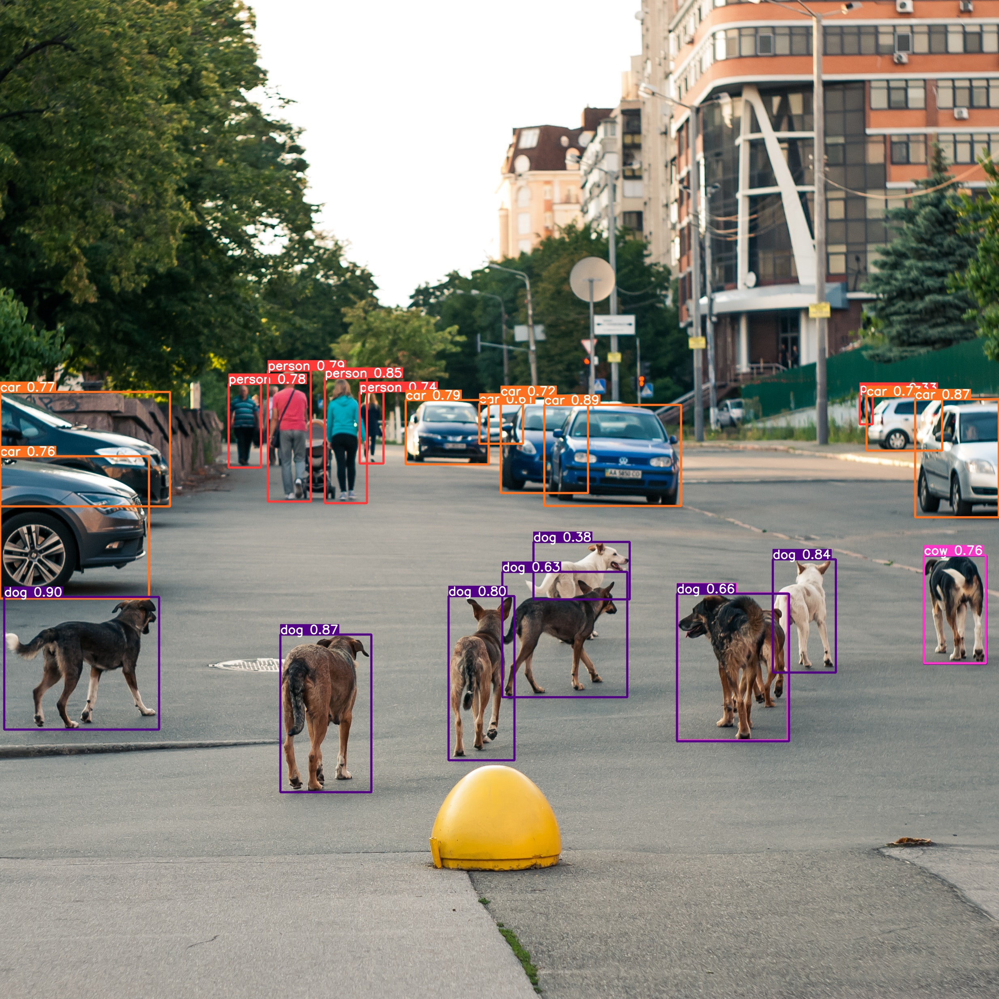

In [ ]:
imgshow(os.path.join(ROOT_DIR,"runs/detect/predict3/dogs_n_cars.jpg"), width = 600)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source="input/test_vid.mp4" save=True

In [ ]:
from ultralytics import YOLO
import numpy as np
from PIL import Image
#import requests
#from io import BytesIO
import cv2
from google.colab.patches import cv2_imshow


In [ ]:
model = YOLO("yolov8n.pt")

In [ ]:
image = Image.open('dogs_n_cars.jpg')
image = np.asarray(image)
results = model.predict(image)


0: 640x640 4 persons, 9 cars, 8 dogs, 1 cow, 12.8ms
Speed: 0.7ms pre-process, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


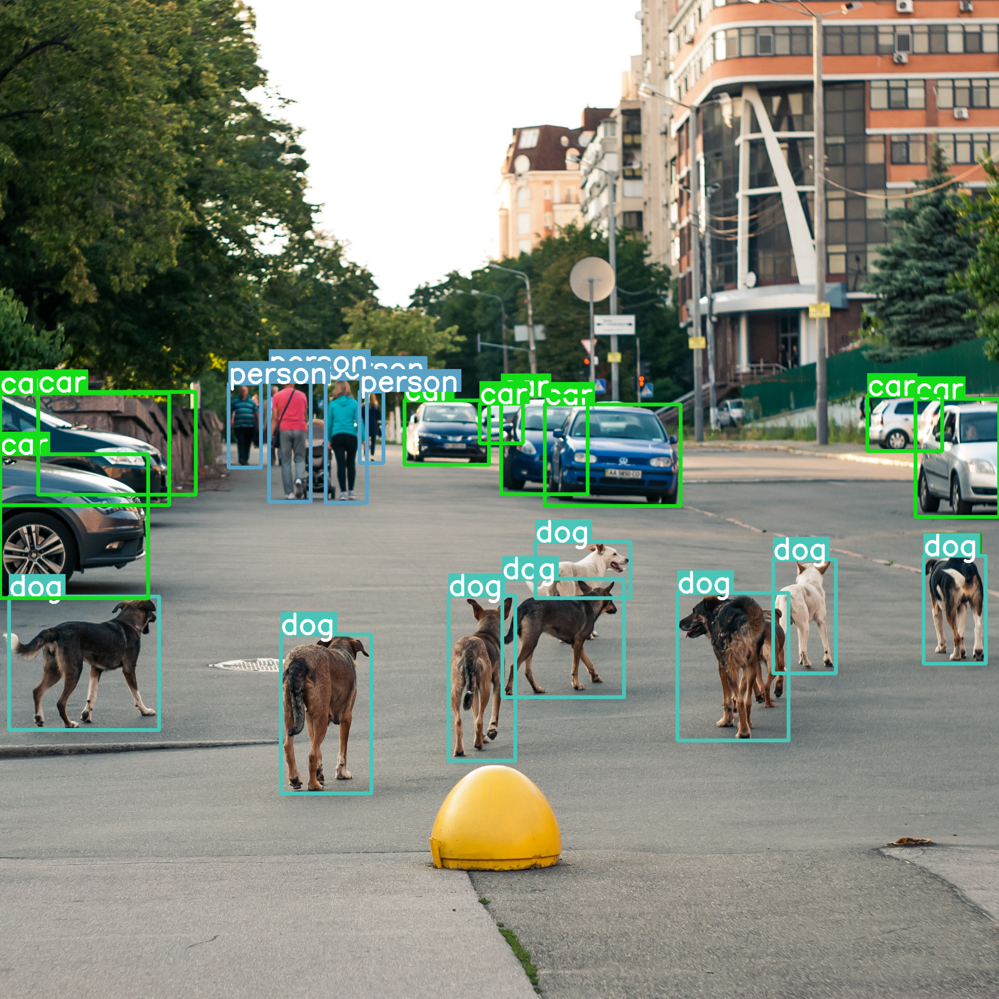

In [ ]:
plot_bboxes(image, results[0].boxes.boxes, score=False)

## Segmentation

In [ ]:
!yolo task=segment mode=predict model='yolov8n-seg.pt' conf=0.25 source="dogs_n_cars.jpg" save=True

Ultralytics YOLOv8.0.31 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
YOLOv8n-seg summary (fused): 195 layers, 3404320 parameters, 0 gradients, 12.6 GFLOPs

image 1/1 /content/gdrive/MyDrive/DL_projects_colab/yolov8/dogs_n_cars.jpg: 640x640 4 persons, 9 cars, 7 dogs, 1 cow, 12.1ms
Speed: 0.8ms pre-process, 12.1ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict3


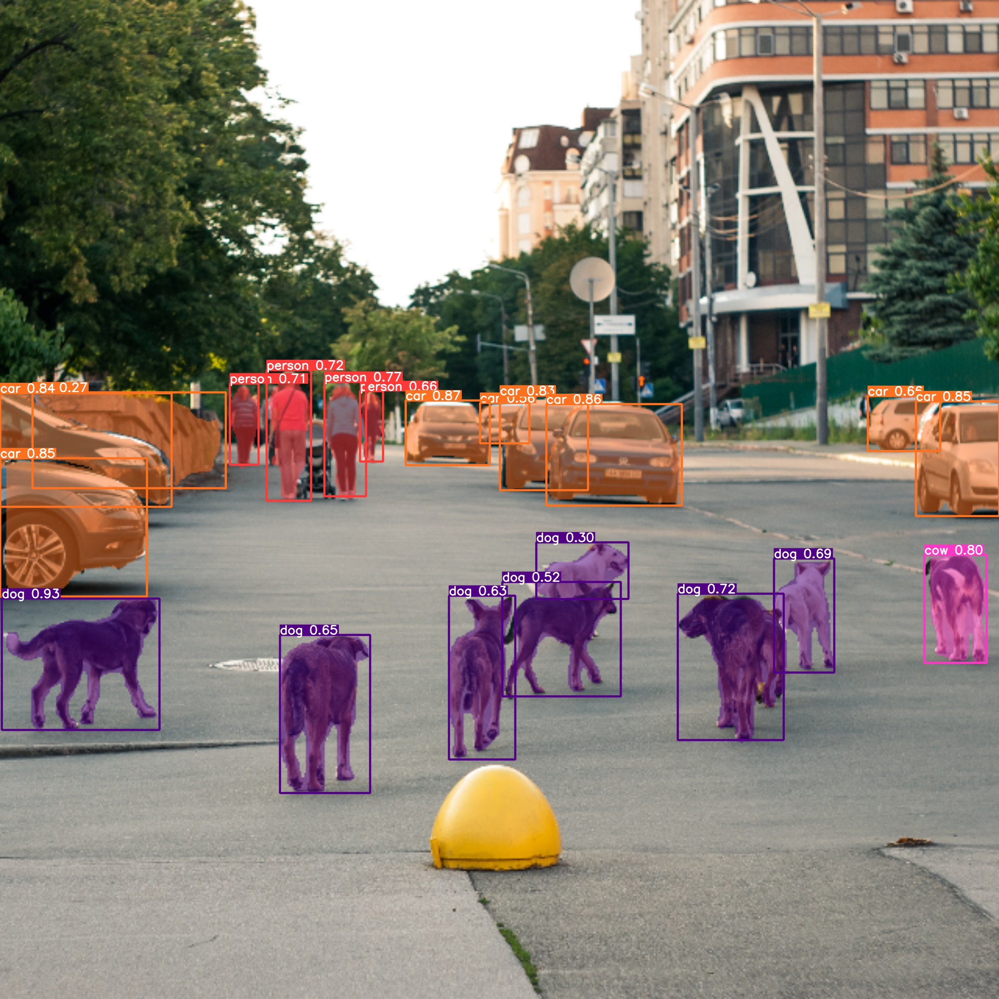

In [ ]:
imgshow(os.path.join(ROOT_DIR,'/runs/segment/predict3/dogs_n_cars.jpg'), width = 600)

In [ ]:
!yolo task=segment mode=predict conf=0.25 source="input/test_vid.mp4" save=True

WARNING ⚠️ 'model' is missing. Using default 'model=yolov8n-seg.pt'.
Ultralytics YOLOv8.0.31 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
YOLOv8n-seg summary (fused): 195 layers, 3404320 parameters, 0 gradients, 12.6 GFLOPs

video 1/1 (1/976) /content/gdrive/MyDrive/DL_projects_colab/yolov8/input/test_vid.mp4: 448x640 1 person, 1 bicycle, 5 cars, 17.3ms
video 1/1 (2/976) /content/gdrive/MyDrive/DL_projects_colab/yolov8/input/test_vid.mp4: 448x640 1 person, 1 bicycle, 5 cars, 9.9ms
video 1/1 (3/976) /content/gdrive/MyDrive/DL_projects_colab/yolov8/input/test_vid.mp4: 448x640 1 person, 1 bicycle, 5 cars, 9.9ms
video 1/1 (4/976) /content/gdrive/MyDrive/DL_projects_colab/yolov8/input/test_vid.mp4: 448x640 1 person, 1 bicycle, 5 cars, 10.2ms
video 1/1 (5/976) /content/gdrive/MyDrive/DL_projects_colab/yolov8/input/test_vid.mp4: 448x640 1 person, 1 bicycle, 5 cars, 9.8ms
video 1/1 (6/976) /content/gdrive/MyDrive/DL_projects_colab/yolov8/input/test_vid.mp4: 448x640 1 person, 

## Training on Custom dataset

In [ ]:
!pip install roboflow



In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key= API_KEY)
project = rf.workspace("roboflow-jvuqo").project("football-players-detection-3zvbc")
dataset = project.version(2).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.31, to fix: `pip install ultralytics<=8.0.20`

Extracting Dataset Version Zip to football-players-detection-2 in yolov8:: 100%|██████████| 1338/1338 [00:08<00:00, 151.73it/s]


In [ ]:
{dataset.location}

{'/content/gdrive/MyDrive/DL_projects_colab/yolov8/football-players-detection-2'}

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

Ultralytics YOLOv8.0.31 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/gdrive/MyDrive/DL_projects_colab/yolov8/football-players-detection-2/data.yaml, epochs=20, patience=50, batch=16, imgsz=640, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, min_memory=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchs

In [ ]:
!yolo task=detect mode=val model={ROOT_DIR}/runs/detect/train3/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.31 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/gdrive/MyDrive/DL_projects_colab/yolov8/football-players-detection-2/valid/labels.cache... 38 images, 0 backgrounds, 0 corrupt: 100% 38/38 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:03<00:00,  1.06s/it]
                   all         38        905      0.861      0.738      0.794      0.562
                  ball         38         35      0.854      0.229      0.361      0.174
            goalkeeper         38         27      0.771      0.889      0.926      0.691
                player         38        754      0.942      0.947      0.981      0.775
               referee         38         89      0.875      0.888       0.91      0.607
Speed: 1.8ms pre-process, 13.7ms inference, 0.1ms loss, 1.5ms post-process per image

In [ ]:
!yolo task=detect mode=predict model={ROOT_DIR}/runs/detect/train3/weights/best.pt conf=0.25 source={dataset.location}/test/images

Ultralytics YOLOv8.0.31 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Model summary (fused): 168 layers, 11127132 parameters, 0 gradients, 28.4 GFLOPs

image 1/13 /content/gdrive/MyDrive/DL_projects_colab/yolov8/football-players-detection-2/test/images/40cd38_7_6_png.rf.dc7957fcce915bc48188f18a7b19455b.jpg: 640x640 21 players, 17.1ms
image 2/13 /content/gdrive/MyDrive/DL_projects_colab/yolov8/football-players-detection-2/test/images/42ba34_1_5_png.rf.927d602c034ce2997f58f62a7c1245ba.jpg: 640x640 1 ball, 1 goalkeeper, 23 players, 3 referees, 17.1ms
image 3/13 /content/gdrive/MyDrive/DL_projects_colab/yolov8/football-players-detection-2/test/images/42ba34_5_5_png.rf.f691b18c36a92663c7241c99d4202bcc.jpg: 640x640 1 goalkeeper, 18 players, 1 referee, 17.2ms
image 4/13 /content/gdrive/MyDrive/DL_projects_colab/yolov8/football-players-detection-2/test/images/4b770a_1_4_png.rf.8a0f6be9776a652d40938181f60b3a6c.jpg: 640x640 1 goalkeeper, 20 players, 3 referees, 17.1ms
image 5/13

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

# Use the model
results = model.train(data="coco128.yaml", epochs=3)  # train the model
results = model.val()  # evaluate model performance on the validation set
results = model("https://ultralytics.com/images/bus.jpg")  # predict on an image
success = YOLO("yolov8n.pt").export(format="onnx")  # export a model to ONNX format


## Function Library

In [ ]:
def box_label(image, box, label='', color=(128, 128, 128), txt_color=(255, 255, 255)):
  lw = max(round(sum(image.shape) / 2 * 0.003), 2)
  p1, p2 = (int(box[0]), int(box[1])), (int(box[2]), int(box[3]))
  cv2.rectangle(image, p1, p2, color, thickness=lw, lineType=cv2.LINE_AA)
  if label:
    tf = max(lw - 1, 1)  # font thickness
    w, h = cv2.getTextSize(label, 0, fontScale=lw / 3, thickness=tf)[0]  # text width, height
    outside = p1[1] - h >= 3
    p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
    cv2.rectangle(image, p1, p2, color, -1, cv2.LINE_AA)  # filled
    cv2.putText(image,
                label, (p1[0], p1[1] - 2 if outside else p1[1] + h + 2),
                0,
                lw / 3,
                txt_color,
                thickness=tf,
                lineType=cv2.LINE_AA)

In [ ]:
def plot_bboxes(image, boxes, labels=[], colors=[], score=True, conf=None):
  #Define COCO Labels
  if labels == []:
    labels = {0: u'__background__', 1: u'person', 2: u'bicycle',3: u'car', 4: u'motorcycle', 5: u'airplane', 6: u'bus', 7: u'train', 8: u'truck', 9: u'boat', 10: u'traffic light', 11: u'fire hydrant', 12: u'stop sign', 13: u'parking meter', 14: u'bench', 15: u'bird', 16: u'cat', 17: u'dog', 18: u'horse', 19: u'sheep', 20: u'cow', 21: u'elephant', 22: u'bear', 23: u'zebra', 24: u'giraffe', 25: u'backpack', 26: u'umbrella', 27: u'handbag', 28: u'tie', 29: u'suitcase', 30: u'frisbee', 31: u'skis', 32: u'snowboard', 33: u'sports ball', 34: u'kite', 35: u'baseball bat', 36: u'baseball glove', 37: u'skateboard', 38: u'surfboard', 39: u'tennis racket', 40: u'bottle', 41: u'wine glass', 42: u'cup', 43: u'fork', 44: u'knife', 45: u'spoon', 46: u'bowl', 47: u'banana', 48: u'apple', 49: u'sandwich', 50: u'orange', 51: u'broccoli', 52: u'carrot', 53: u'hot dog', 54: u'pizza', 55: u'donut', 56: u'cake', 57: u'chair', 58: u'couch', 59: u'potted plant', 60: u'bed', 61: u'dining table', 62: u'toilet', 63: u'tv', 64: u'laptop', 65: u'mouse', 66: u'remote', 67: u'keyboard', 68: u'cell phone', 69: u'microwave', 70: u'oven', 71: u'toaster', 72: u'sink', 73: u'refrigerator', 74: u'book', 75: u'clock', 76: u'vase', 77: u'scissors', 78: u'teddy bear', 79: u'hair drier', 80: u'toothbrush'}
  #Define colors
  if colors == []:
    #colors = [(6, 112, 83), (253, 246, 160), (40, 132, 70), (205, 97, 162), (149, 196, 30), (106, 19, 161), (127, 175, 225), (115, 133, 176), (83, 156, 8), (182, 29, 77), (180, 11, 251), (31, 12, 123), (23, 6, 115), (167, 34, 31), (176, 216, 69), (110, 229, 222), (72, 183, 159), (90, 168, 209), (195, 4, 209), (135, 236, 21), (62, 209, 199), (87, 1, 70), (75, 40, 168), (121, 90, 126), (11, 86, 86), (40, 218, 53), (234, 76, 20), (129, 174, 192), (13, 18, 254), (45, 183, 149), (77, 234, 120), (182, 83, 207), (172, 138, 252), (201, 7, 159), (147, 240, 17), (134, 19, 233), (202, 61, 206), (177, 253, 26), (10, 139, 17), (130, 148, 106), (174, 197, 128), (106, 59, 168), (124, 180, 83), (78, 169, 4), (26, 79, 176), (185, 149, 150), (165, 253, 206), (220, 87, 0), (72, 22, 226), (64, 174, 4), (245, 131, 96), (35, 217, 142), (89, 86, 32), (80, 56, 196), (222, 136, 159), (145, 6, 219), (143, 132, 162), (175, 97, 221), (72, 3, 79), (196, 184, 237), (18, 210, 116), (8, 185, 81), (99, 181, 254), (9, 127, 123), (140, 94, 215), (39, 229, 121), (230, 51, 96), (84, 225, 33), (218, 202, 139), (129, 223, 182), (167, 46, 157), (15, 252, 5), (128, 103, 203), (197, 223, 199), (19, 238, 181), (64, 142, 167), (12, 203, 242), (69, 21, 41), (177, 184, 2), (35, 97, 56), (241, 22, 161)]
    colors = [(89, 161, 197),(67, 161, 255),(19, 222, 24),(186, 55, 2),(167, 146, 11),(190, 76, 98),(130, 172, 179),(115, 209, 128),(204, 79, 135),(136, 126, 185),(209, 213, 45),(44, 52, 10),(101, 158, 121),(179, 124, 12),(25, 33, 189),(45, 115, 11),(73, 197, 184),(62, 225, 221),(32, 46, 52),(20, 165, 16),(54, 15, 57),(12, 150, 9),(10, 46, 99),(94, 89, 46),(48, 37, 106),(42, 10, 96),(7, 164, 128),(98, 213, 120),(40, 5, 219),(54, 25, 150),(251, 74, 172),(0, 236, 196),(21, 104, 190),(226, 74, 232),(120, 67, 25),(191, 106, 197),(8, 15, 134),(21, 2, 1),(142, 63, 109),(133, 148, 146),(187, 77, 253),(155, 22, 122),(218, 130, 77),(164, 102, 79),(43, 152, 125),(185, 124, 151),(95, 159, 238),(128, 89, 85),(228, 6, 60),(6, 41, 210),(11, 1, 133),(30, 96, 58),(230, 136, 109),(126, 45, 174),(164, 63, 165),(32, 111, 29),(232, 40, 70),(55, 31, 198),(148, 211, 129),(10, 186, 211),(181, 201, 94),(55, 35, 92),(129, 140, 233),(70, 250, 116),(61, 209, 152),(216, 21, 138),(100, 0, 176),(3, 42, 70),(151, 13, 44),(216, 102, 88),(125, 216, 93),(171, 236, 47),(253, 127, 103),(205, 137, 244),(193, 137, 224),(36, 152, 214),(17, 50, 238),(154, 165, 67),(114, 129, 60),(119, 24, 48),(73, 8, 110)]
  
  #plot each boxes
  for box in boxes:
    #add score in label if score=True
    if score :
      label = labels[int(box[-1])+1] + " " + str(round(100 * float(box[-2]),1)) + "%"
    else :
      label = labels[int(box[-1])+1]
    #filter every box under conf threshold if conf threshold setted
    if conf :
      if box[-2] > conf:
        color = colors[int(box[-1])]
        box_label(image, box, label, color)
    else:
      color = colors[int(box[-1])]
      box_label(image, box, label, color)

  #show image
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  try:
    import google.colab
    IN_COLAB = True
  except:
    IN_COLAB = False

  if IN_COLAB:
    cv2_imshow(image) #if used in Colab
  else :
    cv2.imshow(image) #if used in Python